# AIS data shader

In [12]:
import pandas as pd
import bokeh
import datashader as ds

import random

import datashader.transfer_functions as tf
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno

import folium
from folium import plugins

from datetime import datetime, time
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors

%pylab inline
pylab.rcParams['figure.figsize'] = (15, 5)
plt.rcParams['axes.facecolor']='white'

import warnings
warnings.filterwarnings('ignore')

from utils import db_connect

Populating the interactive namespace from numpy and matplotlib


# Map Global AIS Positions 

In [4]:
sql_statement = """
SELECT mmsi, longitude, latitude, timestamp
FROM ais_messages.full_year_position;
"""
ais_position_all = db_connect.query(sql_statement)

In [43]:
background = "white"
export = partial(export_image, background = background)
cm = partial(colormap_select, reverse=(background!="white"))

cvs = ds.Canvas(plot_width=4000, plot_height=2000)
agg = cvs.points(ais_position_all, 'longitude', 'latitude')
#export(tf.interpolate(agg, cmap = cm(viridis), how='eq_hist'),"vessels")
image = export(tf.shade(agg, cmap = ['lightblue', 'darkblue'], how='eq_hist'),"vessels")

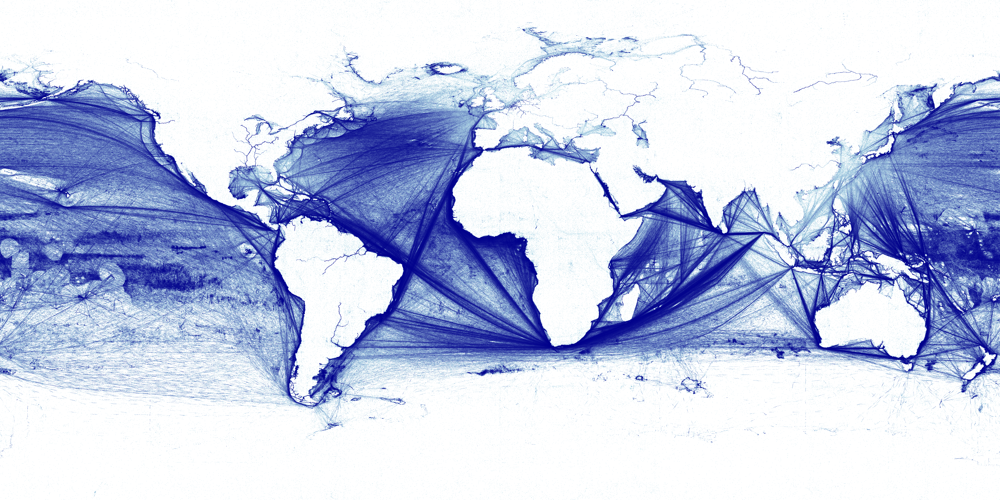

In [46]:
image

### AIS fishing vessels

In [5]:
sql_statement = """
SELECT timestamp, mmsi, ship_and_cargo_type
FROM ais_messages.full_year_static;
"""
ais_static_all = db_connect.query(sql_statement)

In [48]:
fishing_mmsi = ais_static_all[ais_static_all.ship_and_cargo_type == 30].mmsi.unique()

In [49]:
fishing_positional = ais_position_all[ais_position_all.mmsi.isin(fishing_mmsi)]

In [51]:
background = "white"
export = partial(export_image, background = background)
cm = partial(colormap_select, reverse=(background!="white"))

cvs = ds.Canvas(plot_width=4000, plot_height=2000)
agg = cvs.points(fishing_positional, 'longitude', 'latitude')
image2 = export(tf.shade(agg, cmap = ['lightblue', 'darkblue'], how='eq_hist'),"vessels")

In [ ]:
image2

## AIS null vessels

In [8]:
ais_static_all.ship_and_cargo_type.value_counts()

70.0     1017603
30.0      408789
80.0      209458
79.0      169537
0.0       147260
52.0      134301
71.0       87477
90.0       82355
89.0       66579
60.0       63742
37.0       47547
99.0       33629
36.0       28731
81.0       26849
31.0       20028
82.0       19091
74.0       15638
33.0       14924
69.0       14650
50.0       13451
35.0       11235
84.0       10418
32.0        9959
40.0        9526
73.0        9130
72.0        8842
83.0        7922
51.0        7110
55.0        4446
38.0        4222
          ...   
234.0         68
139.0         68
213.0         68
181.0         67
241.0         67
170.0         67
150.0         66
211.0         66
184.0         65
244.0         65
242.0         65
138.0         64
237.0         63
190.0         63
173.0         62
165.0         62
228.0         62
144.0         61
147.0         61
126.0         60
201.0         59
229.0         59
232.0         57
225.0         56
145.0         52
146.0         52
149.0         51
162.0         

In [9]:
null_mmsi = ais_static_all[ais_static_all.ship_and_cargo_type == 0].mmsi.unique()

In [10]:
null_positional = ais_position_all[ais_position_all.mmsi.isin(null_mmsi)]

In [13]:
background = "white"
export = partial(export_image, background = background)
cm = partial(colormap_select, reverse=(background!="white"))

cvs = ds.Canvas(plot_width=4000, plot_height=2000)
agg = cvs.points(null_positional, 'longitude', 'latitude')
image3 = export(tf.shade(agg, cmap = ['lightblue', 'darkblue'], how='eq_hist'),"vessels")

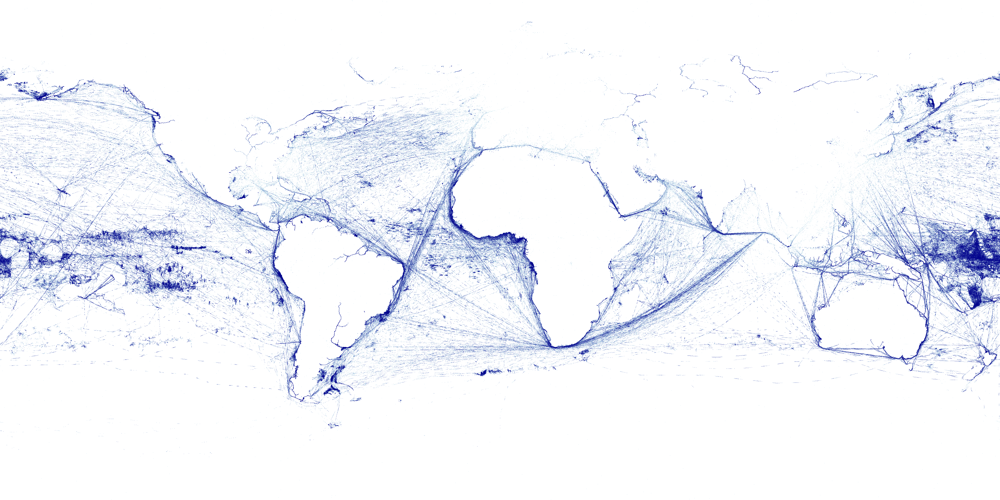

In [14]:
image3